### Notebook for the pseudotime inference using `palantir` prior to `cellrank`

- **Developed by**: carlos Talavera-López Ph.D
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230404

### Load required modules

In [1]:
import os
import palantir
import numpy as np
import scanpy as sc
import pandas as pd

import warnings
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


### Set up working environment

In [2]:
%matplotlib inline
sns.set_style('ticks')
matplotlib.rcParams['figure.figsize'] = [4, 4]
matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams['image.cmap'] = 'Spectral_r'
warnings.filterwarnings(action = "ignore", module = "matplotlib", message = "findfont")

np.random.seed(1769)

sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                 9.4.0
appnope             0.1.3
asttokens           NA
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cffi                1.15.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.6
decorator           5.1.1
defusedxml          0.7.1
executing           1.2.0
fcsparser           0.2.4
h5py                3.8.0
hypergeom_ufunc     NA
igraph              0.10.4
importlib_resources NA
invgauss_ufunc      NA
ipykernel           6.22.0
ipython_genutils    0.2.0
ipywidgets          7.6.5
jedi                0.18.2
joblib              1.2.0
kiwisolver          1.4.4
leidenalg           0.9.1
llvmlite            0.39.1
matplotlib          3.7.1
matplotlib_inline   0.1.6
mpl_toolkits        NA
natsort             8.3.1
nbinom_ufunc        NA
ncf_ufunc           NA
nct_ufunc           NA
ncx2_ufunc       

### Read in dataset

In [3]:
adata = sc.read_h5ad('../data/Marburg_All_ctl230404_leiden_states.raw.h5ad')
adata

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_coun

### Process data to `palantir` liking 

In [4]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

In [5]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "donor",
    subset = True
)
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 97573 × 3000
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', '_scvi_batch', '_scvi_labels', 'IAV_score', 'group', 'C_scANVI', 'cell_type', 'leiden', 'leiden_states'
    var: 'mt', 'ribo', 'n_cells_by_counts-V1', 'mean_counts-V1', 'pct_dropout_by_counts-V1', 'total_counts-V1', 'n_cells_by_counts-V2', 'mean_counts-V2', 'pct_dropout_by_counts-V2', 'total_counts-V2', 'n_cells_by_counts-V3', 'mean_counts-V3', 'pct_dropout_by_counts-V3', 'total_counts-V3', 'n_cells_by_counts-V4', 'mean_counts-V4', 'pct_dropout_by_counts-V4', 'total_counts-V4', 'n_cells_by_counts-V5', 'mean_counts-V5', 'pct_dropout_by_count

### Run diffusion maps using `X_scANVI` instead of PCA 

In [6]:
pca_projections = pd.DataFrame(adata.obsm['X_scANVI'], index = adata.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components = 5)
ms_data = palantir.utils.determine_multiscale_space(dm_res)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)


/Users/cartalop/mambaforge/envs/cellrank/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/cellrank/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/cellrank/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/cellrank/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/cartalop/mambaforge/envs/cellrank/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWar

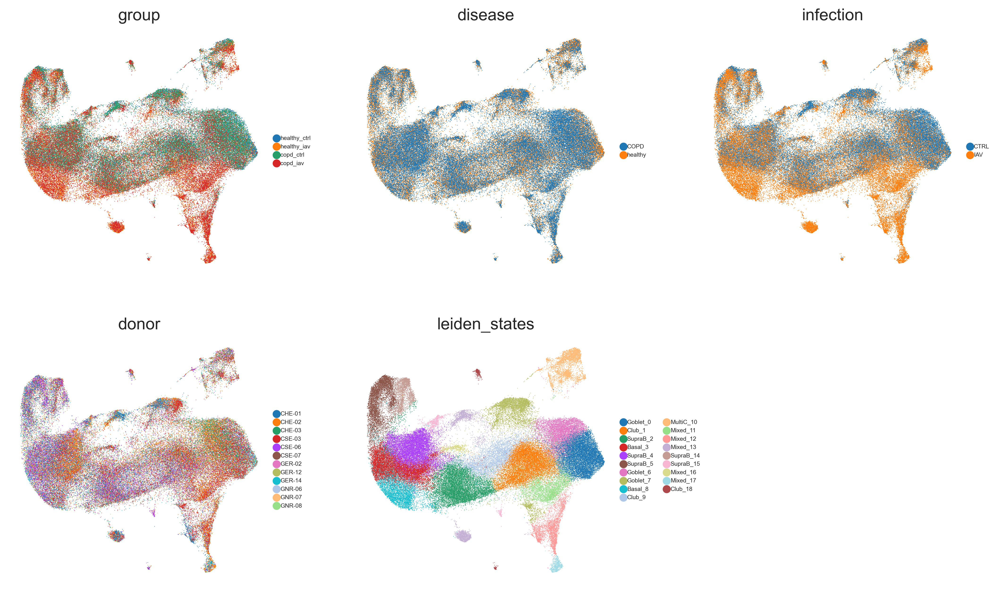

In [7]:
sc.pl.umap(adata, frameon = False, color = ['group', 'disease', 'infection', 'donor', 'leiden_states'], size = 1, legend_fontsize = 5, ncols = 3)

### `MAGIC` imputation

In [8]:
adata.layers['MAGIC_imputed_data'] = palantir.utils.run_magic_imputation(adata, dm_res)

/Users/cartalop/mambaforge/envs/cellrank/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


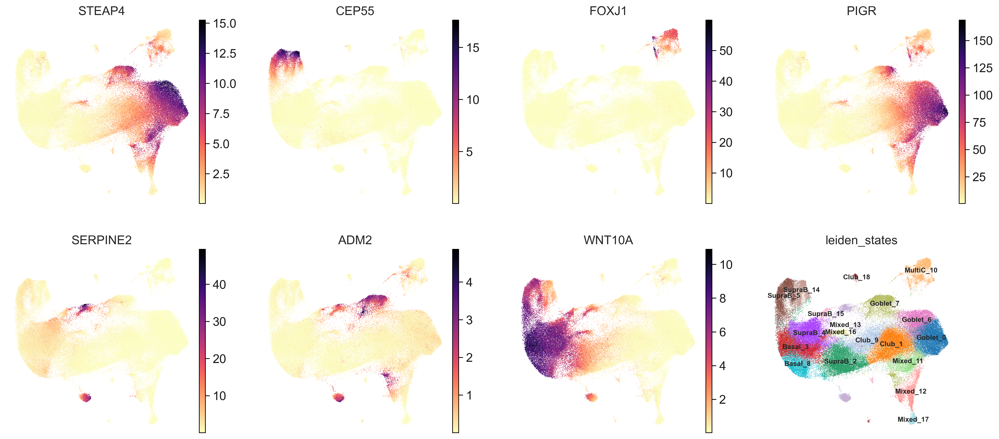

In [9]:
sc.pl.embedding(adata, basis = 'umap', layer = 'MAGIC_imputed_data',
               color=['STEAP4', 'CEP55', 'FOXJ1', 'PIGR', 'SERPINE2', 'ADM2', 'WNT10A', 'leiden_states'], frameon = False, legend_loc = 'on data', legend_fontsize = 8)

### Diffusion maps visualisation

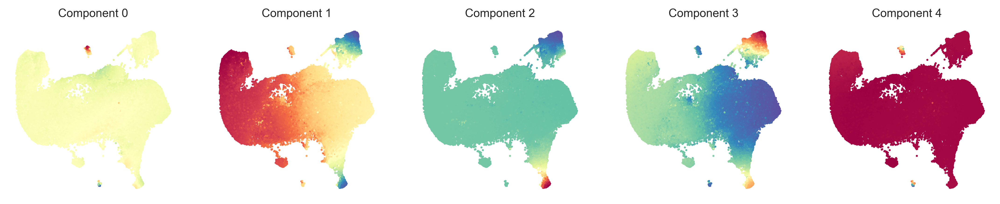

In [10]:
umap = pd.DataFrame(adata.obsm['X_umap'], index = adata.obs_names)
palantir.plot.plot_diffusion_components(umap, dm_res)

### Define start cell and terminal states

In [11]:
gene1 = 'PIGR'
gene2 = 'STEAP4'

In [12]:
coex = (adata[:,'{}'.format(gene1)].X.todense() > 10) & (adata[:,'{}'.format(gene2)].X.todense() > 10)
coex_list = [item for sublist in coex.tolist() for item in sublist]
adata.obs['CoEx'] = pd.Categorical(coex_list, categories = [True, False])

In [19]:
start_cell = adata[adata.obs['leiden_states'].isin(['Mixed_17'])]
start_cell.obs_names

Index(['11359112-CSE_06_CRTL-V2', '10484419-GER14_CRTL-V3',
       '12411664-GnR08_CTRL-V4', '622101-GER12_CTRL-V5',
       '9607717-GER12_CTRL-V5', '7963029-CSE_06_IAV-V2',
       '6932392-CSE_06_IAV-V2', '9153851-CSE_06_IAV-V2',
       '2246793-CSE_06_IAV-V2', '13720013-CSE_06_IAV-V2',
       ...
       '2092041-CHE03_IAV-V5', '20758-CHE03_IAV-V5', '4158418-CHE03_IAV-V5',
       '9294366-CHE03_IAV-V5', '301147-CHE03_IAV-V5', '4584609-CHE03_IAV-V5',
       '5917456-CHE03_IAV-V5', '4278994-CHE03_IAV-V5', '2228382-CSE03_IAV-V6',
       '6074193-CSE03_IAV-V6'],
      dtype='object', length=797)

### Run `palantir`

In [20]:
terminal_states = pd.Series(['Mixed_11', 'Mixed_12', 'Mixed_17'], 
                           index=['342034-ST07_CSE_CTRL-V1', '307691-ST07_CSE_CTRL-V1', '11359112-CSE_06_CRTL-V2'])

In [24]:
ms_data

,0,1,2
588032-ST07_CSE_CTRL-V1,0.642516,0.026129,0.303775
476315-ST07_CSE_CTRL-V1,-0.353576,-0.066486,-0.370356
210114-ST07_CSE_CTRL-V1,-0.368307,-0.071197,-0.374768
593947-ST07_CSE_CTRL-V1,0.057370,-0.024562,-0.108581
300107-ST07_CSE_CTRL-V1,-0.355221,-0.066063,-0.371478
...,...,...,...
7986090-CSE03_IAV-V6,0.414840,0.013991,0.137315
4596870-CSE03_IAV-V6,0.472286,0.024382,0.176761
11523087-CSE03_IAV-V6,0.366390,0.009695,0.106114
163246-CSE03_IAV-V6,0.150551,-0.009678,-0.014374


In [25]:
start_cell = '342034-ST07_CSE_CTRL-V1'
pr_res = palantir.core.run_palantir(ms_data, start_cell, num_waypoints = 500, terminal_states = terminal_states.index)

Sampling and flocking waypoints...
Time for determining waypoints: 0.10643043518066406 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 1.9750834663709005 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


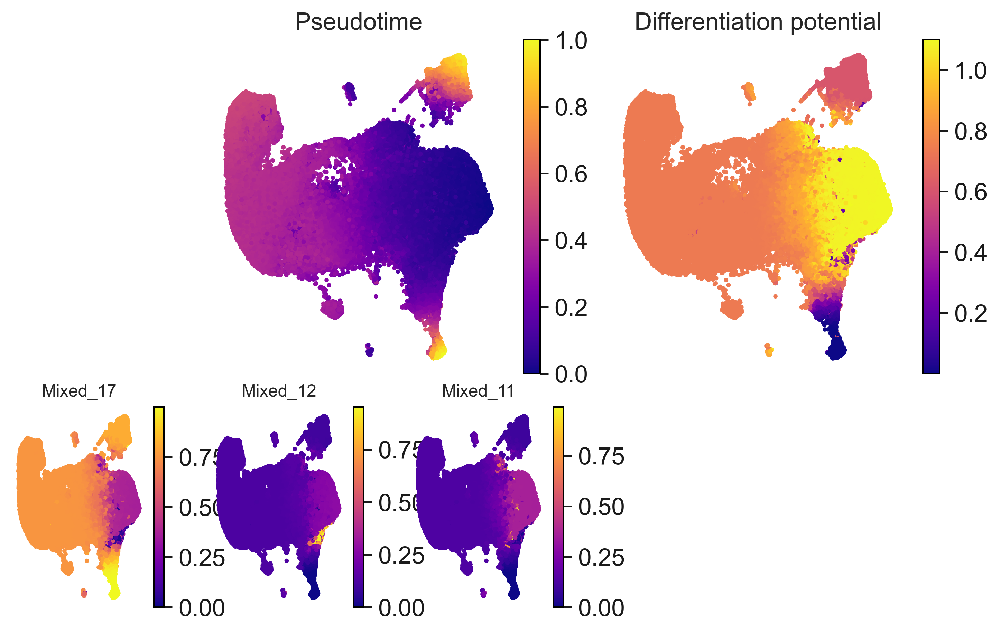

In [26]:
pr_res.branch_probs.columns = terminal_states[pr_res.branch_probs.columns]
palantir.plot.plot_palantir_results(pr_res, umap)